In [1]:
# read csv comcast_consumeraffairs_complaints.csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('comcast_consumeraffairs_complaints.csv')
df.head()

,author,posted_on,rating,text
0,"Alantae of Chesterfeild, MI","Nov. 22, 2016",1,I used to love Comcast. Until all these consta...
1,"Vera of Philadelphia, PA","Nov. 19, 2016",1,I'm so over Comcast! The worst internet provid...
2,"Sarah of Rancho Cordova, CA","Nov. 17, 2016",1,If I could give them a negative star or no sta...
3,"Dennis of Manchester, NH","Nov. 16, 2016",1,I've had the worst experiences so far since in...
4,"Ryan of Bellevue, WA","Nov. 14, 2016",1,Check your contract when you sign up for Comca...


In [2]:
# Texts
texts = df['text'].values
texts

array(["I used to love Comcast. Until all these constant updates. My internet and cable crash a lot at night, and sometimes during the day, some channels don't even work and on demand sometimes don't play either. I wish they will do something about it. Because just a few mins ago, the internet have crashed for about 20 mins for no reason. I'm tired of it and thinking about switching to Wow or something. Please do not get Xfinity.",
       "I'm so over Comcast! The worst internet provider. I'm taking online classes and multiple times was late with my assignments because of the power interruptions in my area that lead to poor quality internet service. Definitely switching to Verizon. I'd rather pay $10 extra then dealing w/ Comcast and non stopping internet problems.",
       "If I could give them a negative star or no stars on this review I would. I have never worked with any industry with as bad of customer service as Comcast. It is not a matter of money because I make well enough abov

In [3]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\islam\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
# if any float type in texts print it
for i in range(len(texts)):
    if type(texts[i]) == float:
        print(i, texts[i])

1321 nan
1322 nan
1323 nan
1325 nan
1326 nan
1327 nan
1328 nan
1329 nan
1330 nan
1331 nan
1332 nan
5613 nan
5614 nan
5615 nan
5617 nan
5618 nan
5619 nan
5620 nan
5621 nan
5623 nan
5624 nan
5625 nan
5626 nan
5630 nan
5634 nan
5636 nan
5637 nan
5638 nan
5639 nan
5640 nan


In [5]:
# remove nan
texts = [text for text in texts if type(text) == str]

In [10]:
# Clean the texts (e.g., remove special characters)
cleaned_texts = [text.lower().strip() for text in texts]


# Function to remove numbers
def remove_numbers(text):
    return ''.join([i for i in text if not i.isdigit()])

# remove punctuation
import string
def remove_punctuation(text):
    return ''.join([i for i in text if i not in string.punctuation])


# remove links like www. and http etc. and hashtags and usernames
def remove_links(text):
    return ' '.join([i for i in text.split() if not i.startswith('www.') and not i.startswith('http') and not i.startswith('@') and not i.startswith('#')])


# remove short words
def remove_shortwords(text):
    return ' '.join([i for i in text.split() if len(i) > 2])

cleaned_texts = [remove_numbers(text) for text in cleaned_texts]
cleaned_texts = [remove_punctuation(text) for text in cleaned_texts]
cleaned_texts = [remove_links(text) for text in cleaned_texts]
cleaned_texts = [remove_shortwords(text) for text in cleaned_texts]


In [11]:
cleaned_texts

['used love comcast until all these constant updates internet and cable crash lot night and sometimes during the day some channels dont even work and demand sometimes dont play either wish they will something about because just few mins ago the internet have crashed for about mins for reason tired and thinking about switching wow something please not get xfinity',
 'over comcast the worst internet provider taking online classes and multiple times was late with assignments because the power interruptions area that lead poor quality internet service definitely switching verizon rather pay extra then dealing comcast and non stopping internet problems',
 'could give them negative star stars this review would have never worked with any industry with bad customer service comcast not matter money because make well enough above and beyond afford their services but they are legitimate ripoff think they are the biggest scam since the mortgage industrys major meltdown and hope move somewhere wher

In [12]:
# Tokenization process
from nltk.tokenize import word_tokenize
tokenized_texts = [word_tokenize(text) for text in cleaned_texts]

tokenized_texts


[['used',
  'love',
  'comcast',
  'until',
  'all',
  'these',
  'constant',
  'updates',
  'internet',
  'and',
  'cable',
  'crash',
  'lot',
  'night',
  'and',
  'sometimes',
  'during',
  'the',
  'day',
  'some',
  'channels',
  'dont',
  'even',
  'work',
  'and',
  'demand',
  'sometimes',
  'dont',
  'play',
  'either',
  'wish',
  'they',
  'will',
  'something',
  'about',
  'because',
  'just',
  'few',
  'mins',
  'ago',
  'the',
  'internet',
  'have',
  'crashed',
  'for',
  'about',
  'mins',
  'for',
  'reason',
  'tired',
  'and',
  'thinking',
  'about',
  'switching',
  'wow',
  'something',
  'please',
  'not',
  'get',
  'xfinity'],
 ['over',
  'comcast',
  'the',
  'worst',
  'internet',
  'provider',
  'taking',
  'online',
  'classes',
  'and',
  'multiple',
  'times',
  'was',
  'late',
  'with',
  'assignments',
  'because',
  'the',
  'power',
  'interruptions',
  'area',
  'that',
  'lead',
  'poor',
  'quality',
  'internet',
  'service',
  'definitely',


In [13]:
# remove stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')

# remove stopwords from tokenized texts
def remove_stopwords(text):
    return [word for word in text if word.lower() not in stopwords.words('english')]

for i in range(len(tokenized_texts)):
    tokenized_texts[i] = remove_stopwords(tokenized_texts[i])
    print(f"{i}.th text is done")

tokenized_texts

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\islam\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0.th text is done
1.th text is done
2.th text is done
3.th text is done
4.th text is done
5.th text is done
6.th text is done
7.th text is done
8.th text is done
9.th text is done
10.th text is done
11.th text is done
12.th text is done
13.th text is done
14.th text is done
15.th text is done
16.th text is done
17.th text is done
18.th text is done
19.th text is done
20.th text is done
21.th text is done
22.th text is done
23.th text is done
24.th text is done
25.th text is done
26.th text is done
27.th text is done
28.th text is done
29.th text is done
30.th text is done
31.th text is done
32.th text is done
33.th text is done
34.th text is done
35.th text is done
36.th text is done
37.th text is done
38.th text is done
39.th text is done
40.th text is done
41.th text is done
42.th text is done
43.th text is done
44.th text is done
45.th text is done
46.th text is done
47.th text is done
48.th text is done
49.th text is done
50.th text is done
51.th text is done
52.th text is done
53.

[['used',
  'love',
  'comcast',
  'constant',
  'updates',
  'internet',
  'cable',
  'crash',
  'lot',
  'night',
  'sometimes',
  'day',
  'channels',
  'dont',
  'even',
  'work',
  'demand',
  'sometimes',
  'dont',
  'play',
  'either',
  'wish',
  'something',
  'mins',
  'ago',
  'internet',
  'crashed',
  'mins',
  'reason',
  'tired',
  'thinking',
  'switching',
  'wow',
  'something',
  'please',
  'get',
  'xfinity'],
 ['comcast',
  'worst',
  'internet',
  'provider',
  'taking',
  'online',
  'classes',
  'multiple',
  'times',
  'late',
  'assignments',
  'power',
  'interruptions',
  'area',
  'lead',
  'poor',
  'quality',
  'internet',
  'service',
  'definitely',
  'switching',
  'verizon',
  'rather',
  'pay',
  'extra',
  'dealing',
  'comcast',
  'non',
  'stopping',
  'internet',
  'problems'],
 ['could',
  'give',
  'negative',
  'star',
  'stars',
  'review',
  'would',
  'never',
  'worked',
  'industry',
  'bad',
  'customer',
  'service',
  'comcast',
  'ma

In [34]:
# Find the most frequently used words
from collections import Counter

word_counts = Counter()
for text in tokenized_texts:
    for word in text:
        word_counts[word] += 1

word_counts


Counter({'used': 397,
         'love': 64,
         'comcast': 14530,
         'constant': 82,
         'updates': 19,
         'internet': 5092,
         'cable': 4439,
         'crash': 8,
         'lot': 262,
         'night': 297,
         'sometimes': 161,
         'day': 2209,
         'channels': 1094,
         'dont': 1948,
         'even': 2093,
         'work': 1983,
         'demand': 238,
         'play': 404,
         'either': 432,
         'wish': 184,
         'something': 730,
         'mins': 114,
         'ago': 808,
         'crashed': 6,
         'reason': 381,
         'tired': 124,
         'thinking': 112,
         'switching': 150,
         'wow': 82,
         'please': 483,
         'get': 5313,
         'xfinity': 675,
         'worst': 689,
         'provider': 448,
         'taking': 177,
         'online': 707,
         'classes': 12,
         'multiple': 274,
         'times': 1689,
         'late': 523,
         'assignments': 11,
         'power': 153,


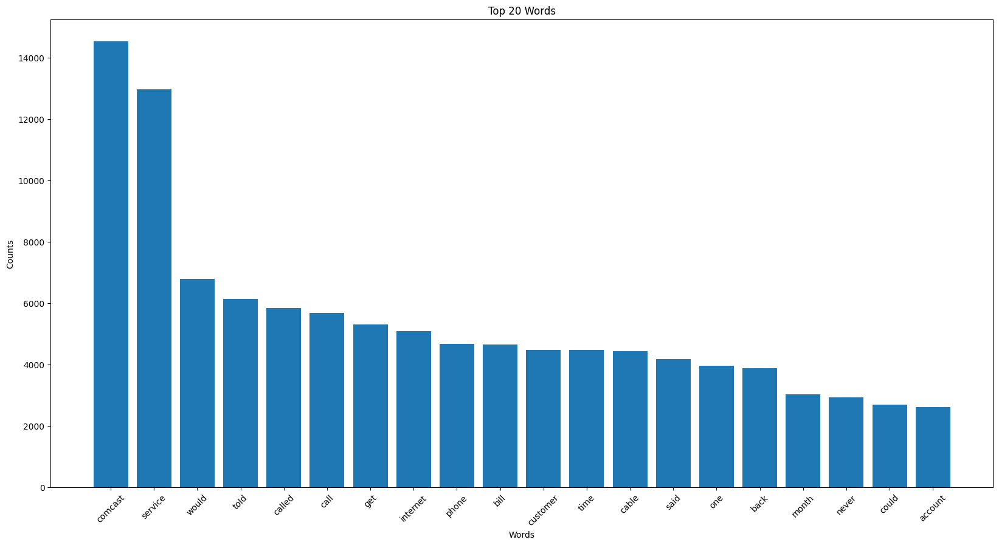

In [35]:
# Pareto Diagram
# sort words by their counts
sorted_word_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)

# get top 20 words
top_20_words = sorted_word_counts[:20]

# get the words and their counts
top_20_words = [word for word, count in top_20_words]
top_20_counts = [count for word, count in sorted_word_counts[:20]]

# plot the diagram
plt.figure(figsize=(20, 10))

plt.bar(top_20_words, top_20_counts)
plt.xticks(rotation=45)
plt.xlabel('Words')
plt.ylabel('Counts')
plt.title('Top 20 Words')
plt.show()

In [36]:
# Create a custom stop words list
custom_stopwords = set(stopwords.words('english'))
custom_stopwords.update(["would", "called", "told", "comcast" , "get", "said", "one", "back", "month", "never", 
                         "could", 'i', 'fcc', 'hello', 'service', 'services', 'issue','want',
                        'issues', 'problem', 'problems', 'xfinity', 'customer', 'complaint', '$',
                        'like','dont', 'come', 'work','got','day'])  # Add custom words

# Remove stop words
def remove_custom_stopwords(text):
    return [word for word in text if word.lower() not in custom_stopwords]

# List of tokenized texts with custom stopwords removed
cleaned_texts = [remove_custom_stopwords(text) for text in tokenized_texts]

In [37]:
cleaned_texts

[['used',
  'love',
  'constant',
  'updates',
  'internet',
  'cable',
  'crash',
  'lot',
  'night',
  'sometimes',
  'channels',
  'even',
  'demand',
  'sometimes',
  'play',
  'either',
  'wish',
  'something',
  'mins',
  'ago',
  'internet',
  'crashed',
  'mins',
  'reason',
  'tired',
  'thinking',
  'switching',
  'wow',
  'something',
  'please'],
 ['worst',
  'internet',
  'provider',
  'taking',
  'online',
  'classes',
  'multiple',
  'times',
  'late',
  'assignments',
  'power',
  'interruptions',
  'area',
  'lead',
  'poor',
  'quality',
  'internet',
  'definitely',
  'switching',
  'verizon',
  'rather',
  'pay',
  'extra',
  'dealing',
  'non',
  'stopping',
  'internet'],
 ['give',
  'negative',
  'star',
  'stars',
  'review',
  'worked',
  'industry',
  'bad',
  'matter',
  'money',
  'make',
  'well',
  'enough',
  'beyond',
  'afford',
  'legitimate',
  'ripoff',
  'think',
  'biggest',
  'scam',
  'since',
  'mortgage',
  'industrys',
  'major',
  'meltdown',

In [38]:
# Lemmatization işlemi
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

def lemmatize_words(text):
    return [lemmatizer.lemmatize(word) for word in text]

cleaned_texts = [lemmatize_words(text) for text in cleaned_texts]

cleaned_texts

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\islam\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


[['used',
  'love',
  'constant',
  'update',
  'internet',
  'cable',
  'crash',
  'lot',
  'night',
  'sometimes',
  'channel',
  'even',
  'demand',
  'sometimes',
  'play',
  'either',
  'wish',
  'something',
  'min',
  'ago',
  'internet',
  'crashed',
  'min',
  'reason',
  'tired',
  'thinking',
  'switching',
  'wow',
  'something',
  'please'],
 ['worst',
  'internet',
  'provider',
  'taking',
  'online',
  'class',
  'multiple',
  'time',
  'late',
  'assignment',
  'power',
  'interruption',
  'area',
  'lead',
  'poor',
  'quality',
  'internet',
  'definitely',
  'switching',
  'verizon',
  'rather',
  'pay',
  'extra',
  'dealing',
  'non',
  'stopping',
  'internet'],
 ['give',
  'negative',
  'star',
  'star',
  'review',
  'worked',
  'industry',
  'bad',
  'matter',
  'money',
  'make',
  'well',
  'enough',
  'beyond',
  'afford',
  'legitimate',
  'ripoff',
  'think',
  'biggest',
  'scam',
  'since',
  'mortgage',
  'industry',
  'major',
  'meltdown',
  'hope',


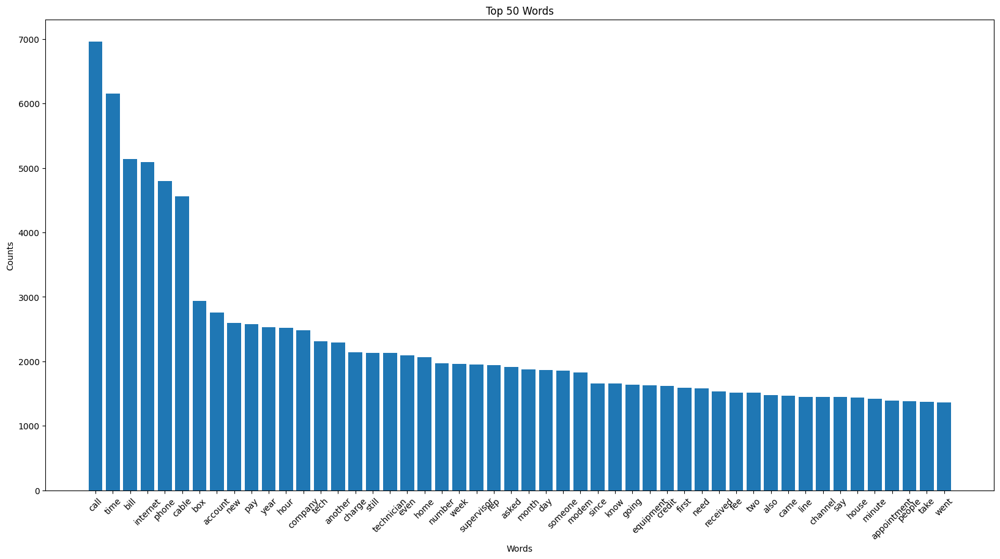

In [39]:
import nltk
from nltk import FreqDist

# Revisiting categorization using NLTK
# Get all the words in the texts
all_words = [word for text in cleaned_texts for word in text]

# Get the frequency distribution of all the words
freq_dist = FreqDist(all_words)

# Get the most common 100 words
most_common_words = freq_dist.most_common(50)

# Get the words and their counts
most_common_words = [word for word, count in most_common_words]
most_common_counts = [count for word, count in freq_dist.most_common(50)]

# Plot the diagram
plt.figure(figsize=(20, 10))

plt.bar(most_common_words, most_common_counts)
plt.xticks(rotation=45)
plt.xlabel('Words')
plt.ylabel('Counts')
plt.title('Top 50 Words')
plt.show()


In [40]:
import gensim
from gensim.corpora import Dictionary

dictionary = Dictionary(cleaned_texts)

print('Distinct words in initial documents:', len(dictionary))

# Filter out words that occur less than 10 documents, or more than 30% of the documents.
dictionary.filter_extremes(no_below=10, no_above=0.3)

print('Distinct words after removing rare and common words:', len(dictionary))

Distinct words in initial documents: 17296
Distinct words after removing rare and common words: 3203


In [41]:
# Find the most common words
from collections import Counter
word_counts = Counter()
for text in cleaned_texts:
    for word in text:
        word_counts[word] += 1

word_counts


Counter({'used': 397,
         'love': 70,
         'constant': 82,
         'update': 102,
         'internet': 5094,
         'cable': 4558,
         'crash': 11,
         'lot': 309,
         'night': 318,
         'sometimes': 161,
         'channel': 1449,
         'even': 2093,
         'demand': 245,
         'play': 412,
         'either': 432,
         'wish': 186,
         'something': 730,
         'min': 249,
         'ago': 808,
         'crashed': 6,
         'reason': 444,
         'tired': 124,
         'thinking': 112,
         'switching': 150,
         'wow': 82,
         'please': 483,
         'worst': 689,
         'provider': 616,
         'taking': 177,
         'online': 707,
         'class': 147,
         'multiple': 274,
         'time': 6156,
         'late': 523,
         'assignment': 14,
         'power': 159,
         'interruption': 111,
         'area': 918,
         'lead': 46,
         'poor': 427,
         'quality': 173,
         'definitely': 91,

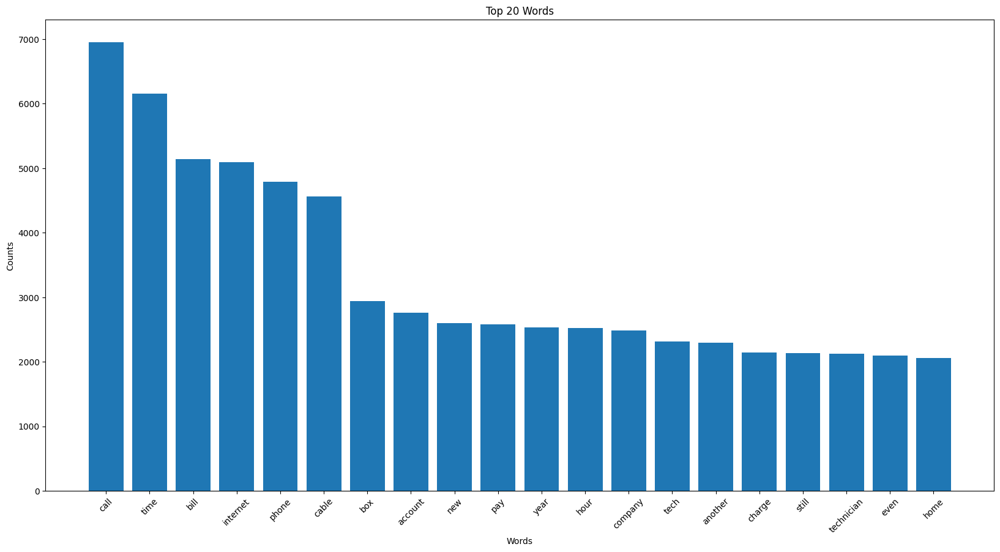

In [42]:
# Pareto Diagram
# sort words by their counts
sorted_word_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)

# get top 20 words
top_20_words = sorted_word_counts[:20]

# get the words and their counts
top_20_words = [word for word, count in top_20_words]
top_20_counts = [count for word, count in sorted_word_counts[:20]]

# plot the diagram
plt.figure(figsize=(20, 10))

plt.bar(top_20_words, top_20_counts)
plt.xticks(rotation=45)
plt.xlabel('Words')
plt.ylabel('Counts')
plt.title('Top 20 Words')
plt.show()

In [43]:
from gensim import corpora
from gensim.models import LdaModel
from gensim.models import CoherenceModel

In [44]:
# Creating Document-Term Matrix (DTM)
dictionary = corpora.Dictionary(cleaned_texts)
doc_term_matrix = [dictionary.doc2bow(text) for text in cleaned_texts]


In [45]:
# Training the LDA model
lda_model = LdaModel(doc_term_matrix, num_topics=7, id2word=dictionary, passes=15)


In [46]:
#!pip install pyLDAvis

In [47]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Visualize the LDA model
lda_display = gensimvis.prepare(lda_model, doc_term_matrix, dictionary, sort_topics=True)
pyLDAvis.display(lda_display)


In [48]:
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
num_topics = 7
for i in range(num_topics):
    print('\nTopic {}\n'.format(str(i)))
    for term, frequency in lda_model.show_topic(i, topn=10):
        print(u'{:20} {:.3f}'.format(term, round(frequency, 3)))


term                 frequency


Topic 0

internet             0.019
time                 0.016
company              0.015
cable                0.012
even                 0.008
year                 0.008
people               0.008
pay                  0.008
cant                 0.008
every                0.007

Topic 1

call                 0.030
phone                0.021
time                 0.018
hour                 0.013
number               0.011
appointment          0.010
home                 0.010
technician           0.009
minute               0.008
someone              0.008

Topic 2

box                  0.031
cable                0.026
call                 0.019
house                0.018
tech                 0.014
time                 0.013
line                 0.011
technician           0.011
came                 0.009
signal               0.009

Topic 3

bill                 0.035
account              0.018
credit               0.013
call                 0.012
pay       

In [49]:
from collections import Counter

topic_assignments = [max(probabilities, key=lambda x: x[1])[0] if probabilities else -1 for probabilities in lda_model[doc_term_matrix]]

# Calculate the number of documents for each topic
topic_counts = Counter(topic_assignments)

# Print the results
for topic, count in topic_counts.items():
    print(f"Topic {topic}: {count} documents")


Topic 0: 1433 documents
Topic 2: 387 documents
Topic 6: 333 documents
Topic 4: 366 documents
Topic 1: 1350 documents
Topic 5: 370 documents
Topic 3: 1390 documents


In [50]:
# Rename the key -1 in topic_counts to 0
# Get the value of the old key
old_value = topic_counts[-1]

# Create an updated Counter with the new key and the old value
new_key = "0"  # New key name
topic_counts[new_key] = old_value

# Remove the old key from the dictionary
del topic_counts[-1]

topic_counts

Counter({0: 1433, 2: 387, 6: 333, 4: 366, 1: 1350, 5: 370, 3: 1390, '0': 0})

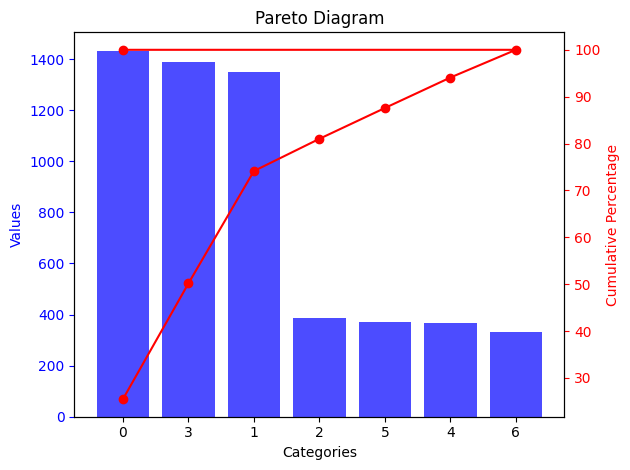

In [51]:
# Plot the topic and counts pareto diagram

# Sort the categories and calculate the total value
sorted_categories = sorted(topic_counts, key=topic_counts.get, reverse=True)
sorted_categories_str = [str(category) for category in sorted_categories]  # Convert categories to strings
sorted_values = [topic_counts[category] for category in sorted_categories]
total = sum(sorted_values)

# Calculate the percentages
cumulative_percentage = [100.0 * x / total for x in sorted_values]
cumulative_percentage = [sum(cumulative_percentage[:i + 1]) for i in range(len(cumulative_percentage))]

# Create a Pareto diagram
fig, ax1 = plt.subplots()

ax1.bar(sorted_categories_str, sorted_values, color='b', alpha=0.7, align='center')
ax1.set_xlabel('Categories')
ax1.set_ylabel('Values', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
ax2.plot(sorted_categories_str, cumulative_percentage, 'r-o', markerfacecolor='r')
ax2.set_ylabel('Cumulative Percentage', color='r')
ax2.tick_params('y', colors='r')

plt.title('Pareto Diagram')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [52]:
#!jupyter nbconvert --to script 'my-notebook.ipynb'